## Data Science Capstone Project


In [1]:
import pandas as pd
import numpy as np
import copy
import folium
import requests
from geopy.geocoders import Nominatim 
from pandas.io.json import json_normalize
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import geopy.distance
from folium.plugins import HeatMap
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
%matplotlib inline

/Users/zewenfeng/anaconda3/lib/python3.6/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
#df_cleaned.to_csv('df.csv')
df_cleaned = pd.read_csv('df.csv')

#### Specify the credentials and query url for Foursquare API before sending requests 

In [352]:
def create_url_and_request(location, section, radius = 2000, offset = 0):
    CLIENT_ID = 'A5IWCWUWRDKZO3QWH3SWVBTAKIHR4WCFFVWEBPWDOON5MSA2' # your Foursquare ID
    CLIENT_SECRET = 'VZHD24UMGZNZGUXODT5WICNV251SUFK23SPXH0JJBTMMJNG2' # your Foursquare Secret
    VERSION = '20200622'
    LIMIT = 50
    url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&section={}&radius={}&offset={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, location[0], location[1], VERSION, section, radius, offset, LIMIT)
    results = requests.get(url).json()
    try:
        venues = results['response']['groups'][0]['items']
        dataframe = json_normalize(venues)
        dataframe['poi_type'] = section
    except:
        return
    return dataframe


In [146]:
address_london = 'London' #start with London

geolocator = Nominatim(user_agent="explore")
location = geolocator.geocode(address_london)
latitude = location.latitude
longitude = location.longitude
London_location = [latitude, longitude]

In [175]:
Peripherals = []
start = geopy.Point(London_location[0], London_location[1])
dist = geopy.distance.geodesic(kilometers = 2)
for i in [0, 60, 120, 180, 240, 300]:
    Peripherals = Peripherals + [list(geopy.Point(dist.destination(point=start, bearing= i))[0:2])]

In [11]:
poi_types = ['coffee', 'drinks', 'food']

In [211]:
df = pd.DataFrame()
for sect in poi_types:
    offset = 0
    while offset < 450:
        df = df.append(create_url_and_request(location = London_location, section = sect, offset = offset))
        offset += 50

In [212]:
for sect in poi_types:
    for locs in Peripherals:
        offset = 0
        while offset < 450:
            pois = create_url_and_request(location = locs, section = sect, offset = offset)
            df = df.append(pois)
            offset += 50

there are 50 coffee in this location, current offset is 50
[51.52529811202519, -0.1276474]
there are 50 coffee in this location, current offset is 100
[51.52529811202519, -0.1276474]
there are 50 coffee in this location, current offset is 150
[51.52529811202519, -0.1276474]
there are 50 coffee in this location, current offset is 200
[51.52529811202519, -0.1276474]
there are 40 coffee in this location, current offset is 250
[51.52529811202519, -0.1276474]
there are 0 coffee in this location, current offset is 300
[51.52529811202519, -0.1276474]
there are 0 coffee in this location, current offset is 350
[51.52529811202519, -0.1276474]
there are 0 coffee in this location, current offset is 400
[51.52529811202519, -0.1276474]
there are 0 coffee in this location, current offset is 450
[51.52529811202519, -0.1276474]
there are 50 coffee in this location, current offset is 50
[51.51630735964321, -0.1026955513542897]
there are 50 coffee in this location, current offset is 100
[51.5163073596432

there are 0 drinks in this location, current offset is 200
[51.489345632568444, -0.1276474]
there are 0 drinks in this location, current offset is 250
[51.489345632568444, -0.1276474]
there are 0 drinks in this location, current offset is 300
[51.489345632568444, -0.1276474]
there are 0 drinks in this location, current offset is 350
[51.489345632568444, -0.1276474]
there are 0 drinks in this location, current offset is 400
[51.489345632568444, -0.1276474]
there are 0 drinks in this location, current offset is 450
[51.489345632568444, -0.1276474]
there are 50 drinks in this location, current offset is 50
[51.49833112117215, -0.15258943184948984]
there are 50 drinks in this location, current offset is 100
[51.49833112117215, -0.15258943184948984]
there are 50 drinks in this location, current offset is 150
[51.49833112117215, -0.15258943184948984]
there are 50 drinks in this location, current offset is 200
[51.49833112117215, -0.15258943184948984]
there are 16 drinks in this location, cur

In [213]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']


In [322]:
# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'poi_type'] + [col for col in df.columns if col.startswith('venue.location.')] + ['venue.id']
df_filtered = df.loc[:, filtered_columns]

# filter the category for each row
df_filtered['venue.categories'] = df_filtered.apply(get_category_type, axis=1)

# clean columns
df_filtered.columns = [col.split('.')[-1] for col in df_filtered.columns]

df_filtered.head(10)

,name,categories,poi_type,address,cc,city,country,crossStreet,distance,formattedAddress,labeledLatLngs,lat,lng,neighborhood,postalCode,state,id
0,Afternoon Tea at the Corinthia Hotel,Tea Room,coffee,10 Whitehall Pl,GB,London,United Kingdom,NaN,243.0,"[10 Whitehall Pl, London, Greater London, SW1A...","[{'label': 'display', 'lat': 51.50657230583427...",51.506572,-0.124350,NaN,SW1A 2BD,Greater London,52764ec8498e83fe786a0595
1,Carpo Piccadilly,Gourmet Shop,coffee,16 Piccadilly,GB,London,United Kingdom,NaN,600.0,"[16 Piccadilly, St. James's, Greater London, W...","[{'label': 'display', 'lat': 51.50956385935709...",51.509564,-0.135536,NaN,W1J 0DE,Greater London,5113babbd63e8bb673ce4b25
2,WA Cafe,Café,coffee,"5, New Row St",GB,London,United Kingdom,NaN,416.0,"[5, New Row St, London, Greater London, WC2N 4...","[{'label': 'display', 'lat': 51.511009, 'lng':...",51.511009,-0.126614,NaN,WC2N 4LH,Greater London,5b731d28e97dfb002c173f37
3,Cafe Nuvo,Café,coffee,4 New Row,GB,London,United Kingdom,NaN,427.0,"[4 New Row, London, Greater London, WC2N 4LH, ...","[{'label': 'display', 'lat': 51.51108819104517...",51.511088,-0.126436,NaN,WC2N 4LH,Greater London,4e11753eb0fbfef99b921f9d
4,The Espresso Room,Coffee Shop,coffee,24 New Row,GB,London,United Kingdom,NaN,424.0,"[24 New Row, London, Greater London, WC2N 4LA,...","[{'label': 'display', 'lat': 51.51107384830445...",51.511074,-0.126568,City of Westminster,WC2N 4LA,Greater London,57a72bfc498eb1432ea9fb76
5,Fortnum & Mason,Department Store,coffee,181 Piccadilly,GB,London,United Kingdom,NaN,772.0,"[181 Piccadilly, St. James's, Greater London, ...","[{'label': 'display', 'lat': 51.50836290883558...",51.508363,-0.138667,NaN,W1A 1ER,Greater London,4ac518ecf964a52075ac20e3
6,Monmouth Coffee Company,Coffee Shop,coffee,27 Monmouth St,GB,Covent Garden,United Kingdom,NaN,780.0,"[27 Monmouth St, Covent Garden, Greater London...","[{'label': 'display', 'lat': 51.514314, 'lng':...",51.514314,-0.126824,Holborn and Covent Garden,WC2H 9EU,Greater London,4ac518edf964a520c1ac20e3
7,Algerian Coffee Stores,Coffee Shop,coffee,52 Old Compton St,GB,London,United Kingdom,NaN,689.0,"[52 Old Compton St, London, Greater London, W1...","[{'label': 'display', 'lat': 51.51286473760223...",51.512865,-0.132084,NaN,W1D 4PB,Greater London,4aeebda6f964a52038d421e3
8,Rapha Cycle Club,Bike Shop,coffee,85 Brewer St,GB,London,United Kingdom,NaN,739.0,"[85 Brewer St, London, Greater London, W1F 9ZN...","[{'label': 'display', 'lat': 51.51084194680312...",51.510842,-0.136704,NaN,W1F 9ZN,Greater London,4f182f1aa17c202e1058990c
9,TY Seven Dials - Timberyard,Coffee Shop,coffee,7 Upper St. Martin's Ln,GB,London,United Kingdom,Tower St,616.0,"[7 Upper St. Martin's Ln (Tower St), London, G...","[{'label': 'display', 'lat': 51.51285291714148...",51.512853,-0.127198,NaN,WC2H 9DL,Greater London,52d543fc11d277ee4a19f7f2


In [331]:
df_filtered['poi_code'] = df_filtered.categories.str.contains('Coffee') * 1 + df_filtered.categories.str.contains('Bar') * 2 + df_filtered.categories.str.contains('Restaurant') * 3 - 1
df_filtered['poi_type'] = [poi_types[x] for x in df_filtered['poi_code']] 

df_filtered.drop_duplicates(subset = 'id', inplace = True)
df_cleaned = df_filtered.loc[df_filtered['poi_code'] >= 0]


In [301]:
london_map = folium.Map(location=London_location, zoom_start=13)
folium.Marker(London_location, popup='London').add_to(london_map)

In [302]:
london_boroughs = requests.get(url = 'https://skgrange.github.io/www/data/london_boroughs.json').json()
def boroughs_style(feature):
    return { 'color': 'blue', 'fill': False }
folium.GeoJson(london_boroughs, style_function=boroughs_style, name='geojson').add_to(london_map)
london_map

In [303]:
latlng_poi = df_cleaned[['lat', 'lng']].values
HeatMap(latlng_poi).add_to(london_map)
london_map

In [304]:
colors = ['red','blue', 'yellow']
for lat, lng, poi_type, poi_code in zip(df_cleaned.lat, df_cleaned.lng, df_cleaned.poi_type, df_cleaned.poi_code):
    label = poi_type
    folium.CircleMarker(
        [lat, lng],
        radius= 2,
        popup=label,
        color=colors[poi_code],
        fill=True,
        fill_color=colors[poi_code],
        fill_opacity=1,
        parse_html=False).add_to(london_map)  

In [305]:
folium.GeoJson(london_boroughs, style_function=boroughs_style, name='geojson').add_to(london_map)
folium.Circle(London_location, radius=1000, fill=False, color='white').add_to(london_map)
folium.Circle(London_location, radius=2000, fill=False, color='white').add_to(london_map)
folium.Circle(London_location, radius=3000, fill=False, color='white').add_to(london_map)
folium.Circle(London_location, radius=4000, fill=False, color='white').add_to(london_map)
london_map

In [498]:
london_map.save('map.html')

In [597]:
def create_url_and_request_venue_rating(venue_id):
    CLIENT_ID = '1EGOZWBG3LNTLBBW0SL0QZHCMLFQXPJN402B205DN4TDQYXI' # your Foursquare ID
    CLIENT_SECRET = 'KBCNUU4XFA1DAH2ZHUIIANYE5N3TQPR2EYWU0UGPAIFPFM32' # your Foursquare Secret
    VERSION = '20200622'
    url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(str(venue_id), CLIENT_ID, CLIENT_SECRET, VERSION)
    result = requests.get(url).json()
    rating = np.nan
    print(result)
    try:
        rating = result['response']['venue']['rating']
    except:
        rating = np.nan
    return rating


In [594]:
df_cleaned.loc[df_cleaned['rating'].apply(np.isnan),'rating'] = df_cleaned.loc[df_cleaned['rating'].apply(np.isnan), 'id'].apply(create_url_and_request_venue_rating)

In [373]:
centers = df_cleaned.groupby(['poi_code'], as_index = False)[['lat', 'lng']].mean()
centers.rename(columns = {'lat' :'lat_centre', 'lng' : 'lng_centre'}, inplace = True)
df_cleaned = pd.merge(df_cleaned, centers, on = 'poi_code')

In [380]:
for i in df_cleaned.index:
    df_cleaned.loc[i, 'dist'] = geopy.distance.distance(tuple(df_cleaned.loc[i, ['lat', 'lng']]), tuple(df_cleaned.loc[i, ['lat_centre', 'lng_centre']])).km * 1000

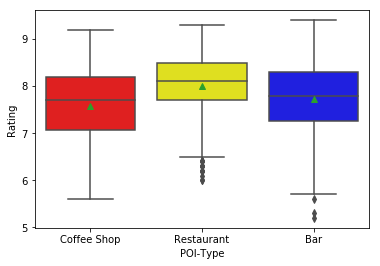

In [599]:
poi_types = ['Coffee Shop', 'Bar', 'Restaurant']
fig, ax = plt.subplots()
my_palette = {'Coffee Shop': 'red', 'Bar':'blue', 'Restaurant' :'yellow'}
df_cleaned['poi_type'] = [poi_types[x] for x in df_cleaned['poi_code']]
sns.boxplot(x = 'poi_type', y = 'rating', data = df_cleaned, palette = my_palette, showmeans = True)

ax.set_ylabel('Rating')
ax.set_xlabel('POI-Type')
fig.savefig('box')

In [383]:
coord_matrix = np.matrix(df_cleaned[['lat', 'lng']].reset_index(drop = True))
vecs = len(coord_matrix)
poi_type_vec = np.matrix(df_cleaned['poi_code'].reset_index(drop = True))

In [385]:
poi_type_vec = poi_type_vec + 1

In [386]:
mat = (poi_type_vec.reshape(vecs, 1) @ poi_type_vec)
same_type_mat = (mat == 1) + (mat == 4) + (mat == 9)


In [387]:
vecs = len(coord_matrix)
dist_matrix = np.zeros((vecs, vecs))
same_type_matrix = dist_matrix
for i in np.arange(vecs):
    for j in np.arange(vecs):
        dist_matrix[i, j] = geopy.distance.distance(tuple(coord_matrix[i].flat), tuple(coord_matrix[j].flat)).km * 1000

In [388]:
same_type_dist = np.multiply(dist_matrix, same_type_mat)

In [821]:
df_cleaned['num_same_type'] =  np.multiply((same_type_dist < 100), (same_type_dist > 0)).sum(axis = 1)
df_cleaned['distance_same_type'] =  np.multiply(same_type_dist, same_type_dist < 100).sum(axis = 1)/np.multiply((same_type_dist < 100), (same_type_dist > 0)).sum(axis = 1)/1000

c:\users\zewen feng\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


In [822]:
model = ols('rating ~ C(poi_type) + num_same_type', data = df_cleaned).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 rating   R-squared:                       0.058
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     24.67
Date:                Wed, 01 Jul 2020   Prob (F-statistic):           1.72e-15
Time:                        11:06:00   Log-Likelihood:                -1334.5
No. Observations:                1205   AIC:                             2677.
Df Residuals:                    1201   BIC:                             2697.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      7.7441      0.042    184.966      0.000       7.662       7.826
C(poi_type)[T.Coffee Shop]    -0.1350      0.058     -2.313      0.021      -0.249      -0.020
C(poi_type)[T.Restaurant]      0.2790      0.050      5.550      0.000       0.180       0.378
num_same_type                 -0.0200      0.011     -1.809      0.071      -0.042       0.002
==============================================================================
Omnibus:                       66.186   Durbin-Watson:                   0.929
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               76.143
Skew:                          -0.613   Prob(JB):                     2.92e-17
Kurtosis:                       3.116   Cond. No.                         8.98
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [823]:
model = ols('rating ~ C(poi_type) + distance_same_type', data = df_cleaned).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 rating   R-squared:                       0.055
Model:                            OLS   Adj. R-squared:                  0.051
Method:                 Least Squares   F-statistic:                     14.13
Date:                Wed, 01 Jul 2020   Prob (F-statistic):           5.79e-09
Time:                        11:06:01   Log-Likelihood:                -824.64
No. Observations:                 736   AIC:                             1657.
Df Residuals:                     732   BIC:                             1676.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      7.6767      0.089     86.266      0.000       7.502       7.851
C(poi_type)[T.Coffee Shop]    -0.1787      0.076     -2.351      0.019      -0.328      -0.029
C(poi_type)[T.Restaurant]      0.2361      0.068      3.487      0.001       0.103       0.369
distance_same_type             1.0441      1.225      0.853      0.394      -1.360       3.448
==============================================================================
Omnibus:                       32.051   Durbin-Watson:                   0.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               35.556
Skew:                          -0.535   Prob(JB):                     1.90e-08
Kurtosis:                       2.886   Cond. No.                         51.8
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

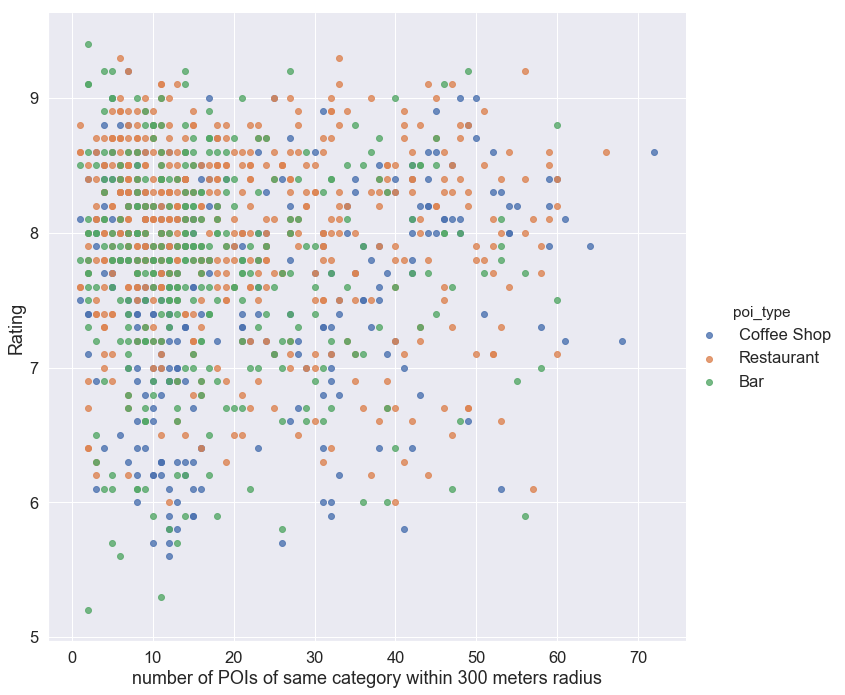

In [696]:
sns.set(font_scale=1.5)
ax = sns.lmplot(x = 'distance_same_type', y = 'rating', hue = 'poi_type', data = df_cleaned, height = 10, fit_reg = False)
ax.set_axis_labels('number of POIs of same category within 300 meters radius', 'Rating')
ax.savefig('jointplot')

In [705]:
X = df_cleaned[['lat', 'lng']]
Y = df_cleaned['poi_code']
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2)
model = KMeans(n_clusters = 3).fit(X_train)
sklearn.metrics.accuracy_score(Y_test, model.predict(X_test))

0.33061224489795921

In [706]:
df_cleaned['cluster'] = model.predict(X)

In [760]:
colors = ['red', 'yellow', 'green', 'black', 'orange']

london_map1 = folium.Map(location=London_location, zoom_start=13)
folium.GeoJson(london_boroughs, style_function=boroughs_style, name='geojson').add_to(london_map1)
for lat, lng, poi_type, cluster in zip(df_cleaned.lat, df_cleaned.lng, df_cleaned.poi_type, df_cleaned.cluster):
    label = poi_type
    folium.CircleMarker(
        [lat, lng],
        radius= 2,
        popup=label,
        color=colors[cluster],
        fill=True,
        fill_color=colors[cluster],
        fill_opacity=1,
        parse_html=False).add_to(london_map1)
london_map1.save('mapcluster.html')

In [761]:
london_map1

In [712]:
cluster_centre = df_cleaned.groupby(['cluster'], as_index = False)[['lat', 'lng']].mean()
cluster_centre.rename(columns = {'lat' :'cluster_lat', 'lng' :'cluster_lng'}, inplace = True)

In [713]:
df_cleaned.drop(columns = ['cluster_lat', 'cluster_lng'], inplace = True)

In [714]:
df_cleaned = pd.merge(df_cleaned, cluster_centre, on = 'cluster')

In [715]:
for i in df_cleaned.index:
    df_cleaned.loc[i, 'dist_cluster'] = geopy.distance.distance(tuple(df_cleaned.loc[i, ['lat', 'lng']]), tuple(df_cleaned.loc[i, ['cluster_lat', 'cluster_lng']])).km * 1000

In [716]:
df_cleaned['coffee'] = 0+(df_cleaned['poi_code']== 0)
df_cleaned['bar'] = 0 + (df_cleaned['poi_code'] == 1)
for i in df_cleaned.index:
    df_cleaned.loc[i, 'dist_km'] = geopy.distance.distance(tuple(df_cleaned.loc[i, ['lat', 'lng']]), tuple(London_location)).km * 1000

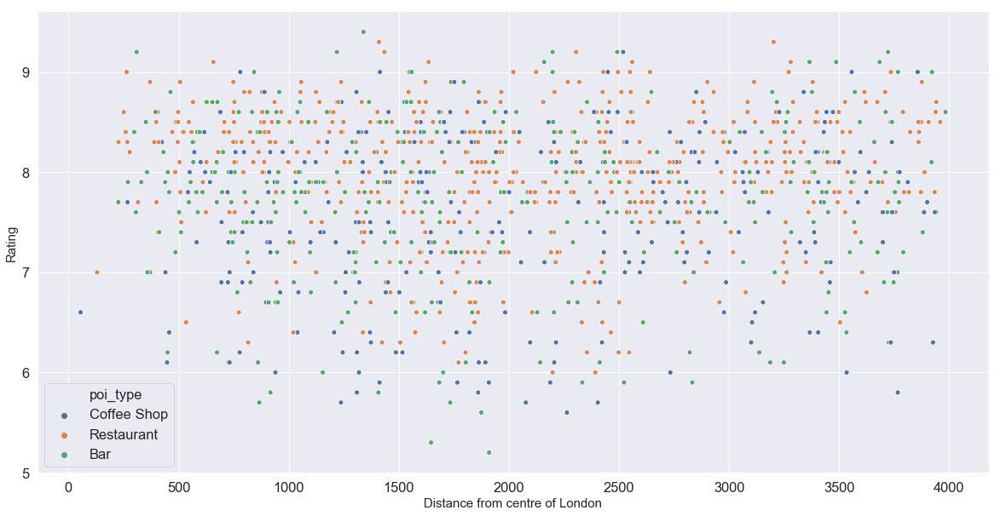

In [717]:
fig, ax = plt.subplots(figsize = (20, 10))
ax = sns.scatterplot(x = 'dist_km', y = 'rating', hue = 'poi_type', data = df_cleaned, s = 35)
ax.set_xlabel('Distance from centre of London', size = 15)
ax.set_ylabel('Rating', size = 15)
fig.savefig('distance from centre of london')

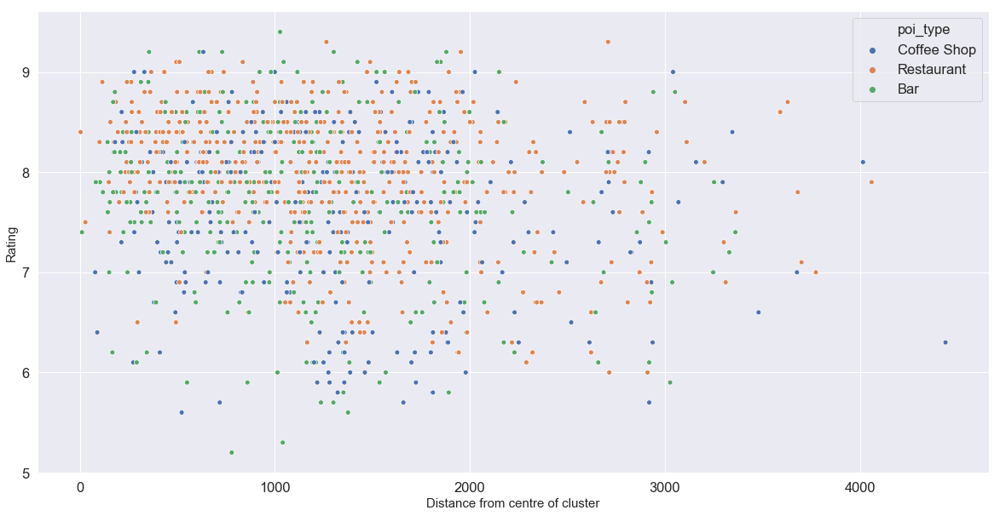

In [718]:
fig, ax = plt.subplots(figsize = (20, 10))
ax = sns.scatterplot(x = 'dist_cluster', y = 'rating', hue = 'poi_type', data = df_cleaned, s = 35)
ax.set_xlabel('Distance from centre of cluster', size = 15)
ax.set_ylabel('Rating', size = 15)
fig.savefig('distance from centre of cluster')

In [8]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
model = ols('rating ~ C(poi_type) + dist_km', data=df_cleaned).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 rating   R-squared:                       0.056
Model:                            OLS   Adj. R-squared:                  0.054
Method:                 Least Squares   F-statistic:                     23.75
Date:                Tue, 30 Jun 2020   Prob (F-statistic):           6.19e-15
Time:                        17:35:14   Log-Likelihood:                -1335.8
No. Observations:                1205   AIC:                             2680.
Df Residuals:                    1201   BIC:                             2700.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      7.6856      0.057    134.049      0.000       7.573       7.798
C(poi_type)[T.Coffee Shop]    -0.1454      0.058     -2.492      0.013      -0.260      -0.031
C(poi_type)[T.Restaurant]      0.2719      0.050      5.399      0.000       0.173       0.371
dist_km                        0.0177      0.022      0.818      0.413      -0.025       0.060
==============================================================================
Omnibus:                       66.761   Durbin-Watson:                   0.834
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               77.024
Skew:                          -0.618   Prob(JB):                     1.88e-17
Kurtosis:                       3.084   Cond. No.                         9.13
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [831]:
df_cleaned['far_2km'] = (df_cleaned['dist_km'] > 2000) + 0
df_cleaned['dist_km'] = df_cleaned['dist_km']/1000
model = ols('rating ~ dist_km * far_2km + C(poi_type)', data = df_cleaned).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 rating   R-squared:                       0.072
Model:                            OLS   Adj. R-squared:                  0.068
Method:                 Least Squares   F-statistic:                     18.64
Date:                Wed, 01 Jul 2020   Prob (F-statistic):           7.22e-18
Time:                        11:18:50   Log-Likelihood:                -1325.4
No. Observations:                1205   AIC:                             2663.
Df Residuals:                    1199   BIC:                             2693.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      7.9628      0.085     94.038      0.000       7.797       8.129
C(poi_type)[T.Coffee Shop]    -0.1340      0.058     -2.313      0.021      -0.248      -0.020
C(poi_type)[T.Restaurant]      0.2851      0.050      5.695      0.000       0.187       0.383
dist_km                       -0.2250      0.061     -3.701      0.000      -0.344      -0.106
far_2km                       -0.6148      0.187     -3.296      0.001      -0.981      -0.249
dist_km:far_2km                0.3611      0.083      4.341      0.000       0.198       0.524
==============================================================================
Omnibus:                       56.218   Durbin-Watson:                   0.927
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               63.399
Skew:                          -0.562   Prob(JB):                     1.71e-14
Kurtosis:                       3.035   Cond. No.                         31.3
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [685]:
model = ols('rating ~ C(poi_type)', data=df_cleaned).fit()
aov_table = sm.stats.anova_lm(model, typ=2)
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 rating   R-squared:                       0.055
Model:                            OLS   Adj. R-squared:                  0.054
Method:                 Least Squares   F-statistic:                     35.30
Date:                Tue, 30 Jun 2020   Prob (F-statistic):           1.27e-15
Time:                        21:42:38   Log-Likelihood:                -1336.1
No. Observations:                1205   AIC:                             2678.
Df Residuals:                    1202   BIC:                             2694.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      7.7195      0.040    194.703      0.000       7.642       7.797
C(poi_type)[T.Coffee Shop]    -0.1428      0.058     -2.452      0.014      -0.257      -0.029
C(poi_type)[T.Restaurant]      0.2745      0.050      5.462      0.000       0.176       0.373
==============================================================================
Omnibus:                       67.008   Durbin-Watson:                   0.840
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               77.325
Skew:                          -0.619   Prob(JB):                     1.62e-17
Kurtosis:                       3.091   Cond. No.                         4.12
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""